<a href="https://colab.research.google.com/github/21ITR047-KAMINI/Stegnography/blob/main/Stegnography.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files

uploaded = files.upload()  # This opens a file upload dialog

Saving natural.jpg to natural.jpg


Message encrypted successfully!


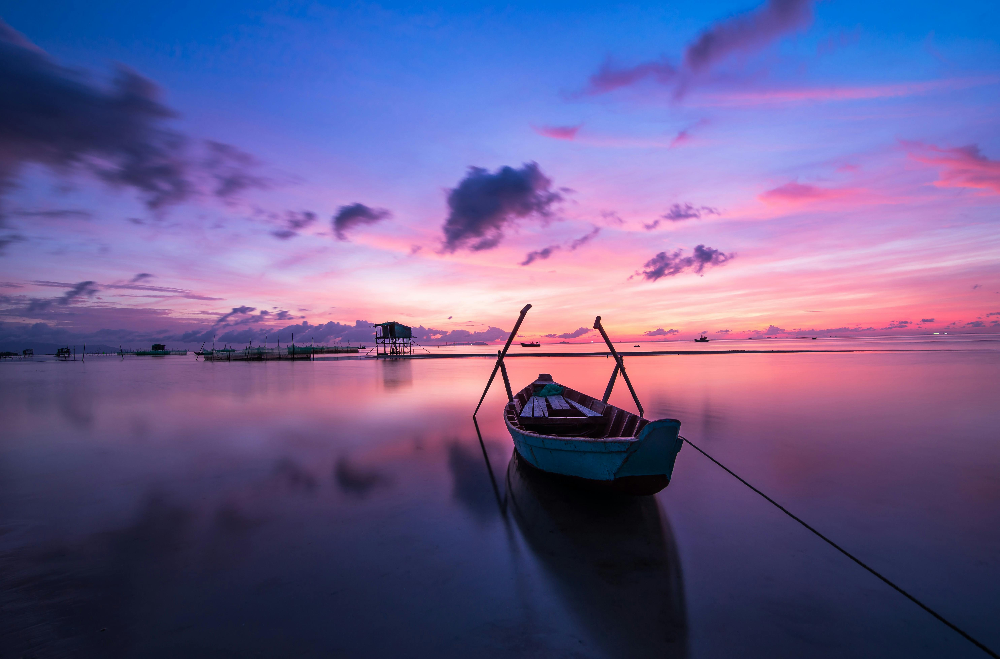

Decrypted message: welcome


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import files

def encode_message(img, msg):
    msg += '####'  # End-of-message marker
    binary_msg = ''.join(format(ord(char), '08b') for char in msg)  # Convert message to binary
    idx = 0

    for row in img:
        for pixel in row:
            for i in range(3):  # Modify R, G, B channels
                if idx < len(binary_msg):
                    pixel[i] = (pixel[i] & 0b11111110) | int(binary_msg[idx])  # Set LSB
                    idx += 1
                else:
                    break

    cv2.imwrite("encryptedImage.png", img)
    print("Message encrypted successfully!")
    cv2_imshow(cv2.imread("encryptedImage.png"))  # Show encrypted image in Colab

def decode_message(img):
    binary_msg = ""

    for row in img:
        for pixel in row:
            for i in range(3):
                binary_msg += str(pixel[i] & 1)  # Extract LSB

    msg = ""
    for i in range(0, len(binary_msg), 8):
        char = chr(int(binary_msg[i:i+8], 2))
        if char == '#' and msg.endswith("###"):  # Stop when marker is found
            return msg[:-3]  # Remove marker
        msg += char

    return msg

# Load image (use natural.jpg instead of mypic.jpg)
image_path = "natural.jpg"  # Make sure this matches the uploaded filename
img = cv2.imread(image_path)

if img is None:
    print("Error: Image not found! Make sure to upload 'natural.jpg'.")
else:
    message = input("Enter the secret message: ")
    encode_message(img, message)

    # Decryption
    img = cv2.imread("encryptedImage.png")  # Reload modified image
    decoded_msg = decode_message(img)
    print("Decrypted message:", decoded_msg)

    # Provide download link for encrypted image
    files.download("encryptedImage.png")
